In [ ]:
!pip install yfinance
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
amazon = yf.Ticker("AMZN")
amzn = amazon.history(start="2022-02-01", end="2023-02-01", interval="1d")

In [ ]:
# check for missing values
amzn.isnull().sum()

Open            0
High            0
Low             0
Close           0
Volume          0
Dividends       0
Stock Splits    0
dtype: int64

In [ ]:
# there are no missing values
amzn.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2022-02-01 00:00:00-05:00,150.000000,151.707993,147.627502,151.193497,59220000,0.0,0.0
2022-02-02 00:00:00-05:00,155.050507,155.074997,148.863495,150.612503,87330000,0.0,0.0
2022-02-03 00:00:00-05:00,141.737503,144.247498,138.332993,138.845505,225532000,0.0,0.0
2022-02-04 00:00:00-05:00,155.606506,161.199997,150.608002,157.639496,253456000,0.0,0.0
2022-02-07 00:00:00-05:00,158.520004,162.690994,157.250000,157.935501,102624000,0.0,0.0


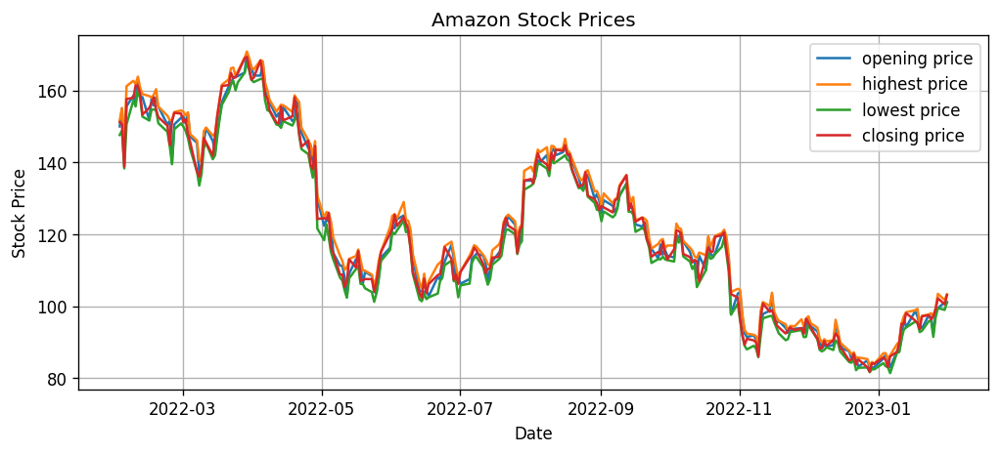

In [ ]:
# plot all the prices for amazon
plt.figure(figsize=(10,4), dpi=120)
plt.plot(amzn['Open'], label='opening price')
plt.plot(amzn['High'], label='highest price')
plt.plot(amzn['Low'], label='lowest price')
plt.plot(amzn['Close'], label='closing price')
plt.title('Amazon Stock Prices')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.grid(True)
plt.show()

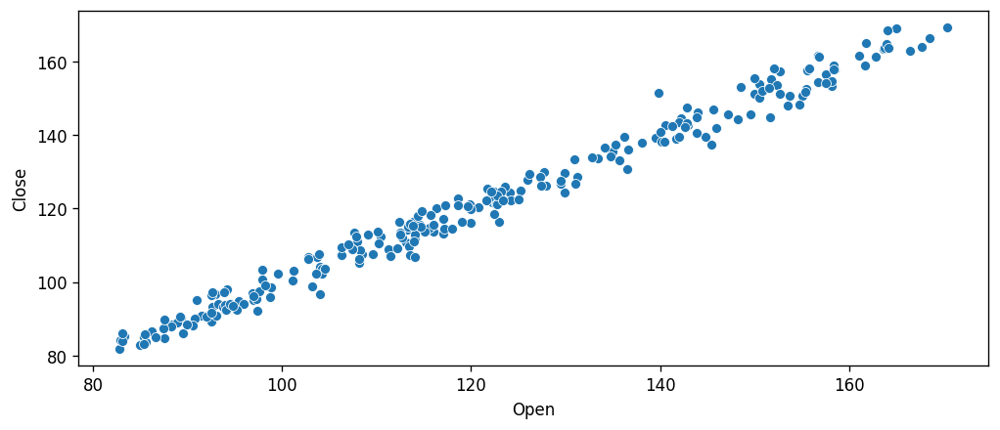

In [ ]:
# compare opening vs closing price
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=amzn, x='Open', y='Close')
plt.show()

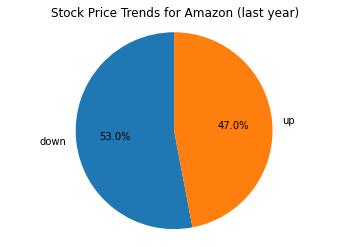

In [ ]:
# trends using pie chart
amzn['returns'] = (amzn['Close'] - amzn['Open']) / amzn['Open']

# Create a new column that indicates if the stock price trended up or down each day
amzn['trend'] = 'up'
amzn.loc[amzn['returns'] < 0, 'trend'] = 'down'

# Count the number of times the stock price trended up and down
trend_counts = amzn['trend'].value_counts()

# Plot the data as a pie chart
plt.pie(trend_counts, labels=trend_counts.index, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Stock Price Trends for Amazon (last year)')
plt.show()

In [ ]:
# correlation among prices
amzn.corr()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,returns
Open,1.000000,0.997342,0.997202,0.992587,-0.168662,NaN,0.010555,-0.067520
High,0.997342,1.000000,0.997666,0.997032,-0.152262,NaN,0.014843,-0.009514
Low,0.997202,0.997666,1.000000,0.997208,-0.189679,NaN,0.012935,-0.007680
Close,0.992587,0.997032,0.997208,1.000000,-0.170975,NaN,0.009618,0.052203
Volume,-0.168662,-0.152262,-0.189679,-0.170975,1.000000,NaN,0.113716,-0.015683
Dividends,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Stock Splits,0.010555,0.014843,0.012935,0.009618,0.113716,NaN,1.000000,-0.008359
returns,-0.067520,-0.009514,-0.007680,0.052203,-0.015683,NaN,-0.008359,1.000000


In [ ]:
amzn['returns'] = (amzn['Close'] - amzn['Open']) / amzn['Open']

# Calculate the average daily return
average_daily_return = amzn['returns'].mean()

print("The average daily return for Amazon stock over the last year is: {:.2f}%".format(average_daily_return*100))

The average daily return for Amazon stock over the last year is: -0.05%


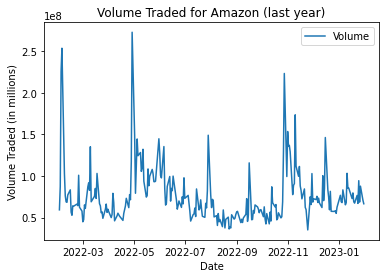

In [ ]:
# change in Amazon stocks traded over time
plt.plot(amzn.index, amzn['Volume'], label='Volume')
plt.title('Volume Traded for Amazon (last year)')
plt.xlabel('Date')
plt.ylabel('Volume Traded (in millions)')
plt.legend()
plt.show()

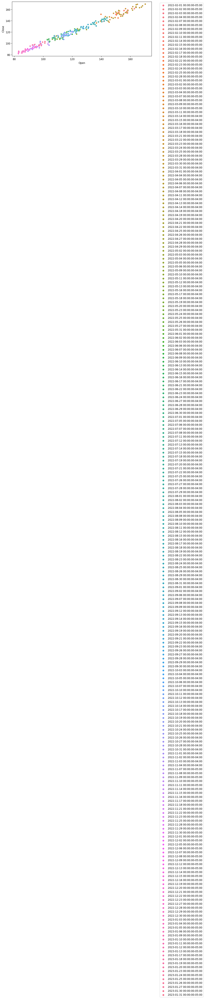

In [ ]:
# We see a linear relationship between opening and closing price, lets check it using dates
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=amzn, x='Open', y='Close', hue='Date')
plt.legend(bbox_to_anchor=[1.05,1])
plt.show()

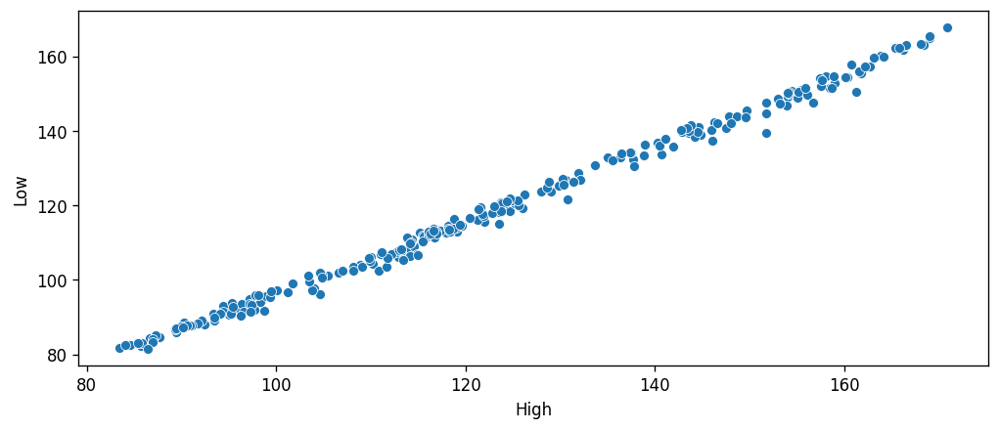

In [ ]:
# compare high vs low price
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=amzn, x='High', y='Low')
plt.show()

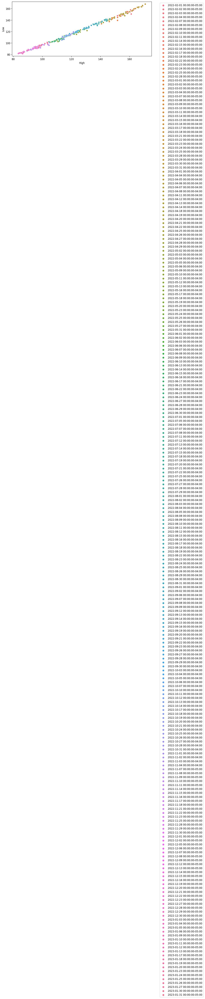

In [ ]:
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=amzn, x='High', y='Low', hue='Date')
plt.legend(bbox_to_anchor=[1.05,1])
plt.show()

<Figure size 1200x480 with 0 Axes>

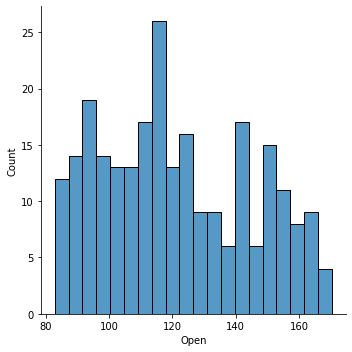

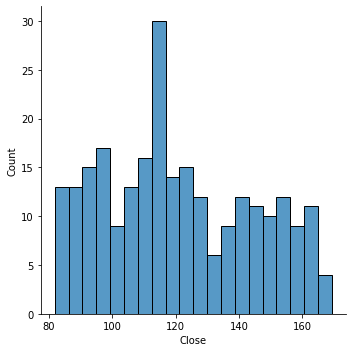

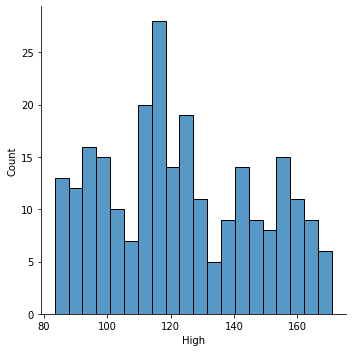

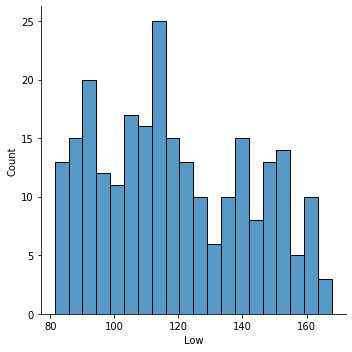

In [ ]:
# Explore the histograms of prices
plt.figure(figsize=(10,4), dpi=120)
sns.displot(data=amzn, x='Open',bins=20)
sns.displot(data=amzn, x='Close',bins=20)
sns.displot(data=amzn, x='High',bins=20)
sns.displot(data=amzn, x='Low',bins=20)
plt.show()

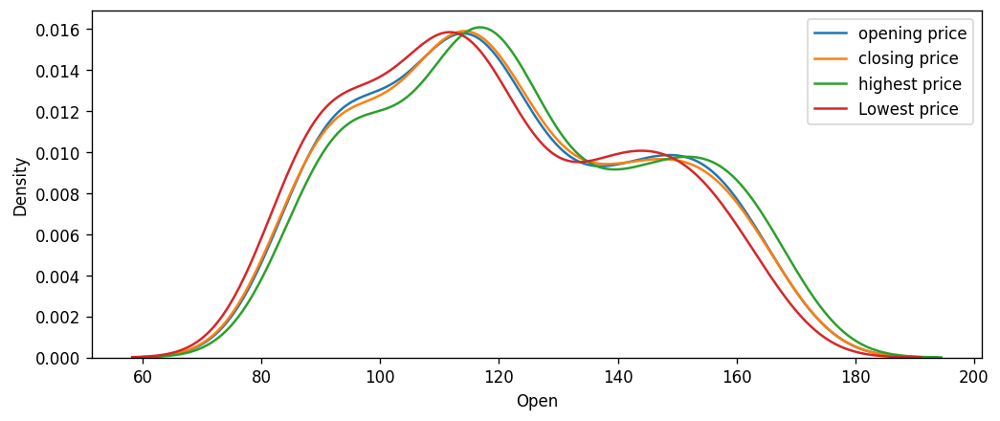

In [ ]:
# kdeplots of prices
plt.figure(figsize=(10,4), dpi=120)
sns.kdeplot(data=amzn, x='Open', label='opening price')
sns.kdeplot(data=amzn, x='Close', label='closing price')
sns.kdeplot(data=amzn, x='High', label='highest price')
sns.kdeplot(data=amzn, x='Low', label='Lowest price')
plt.legend()
plt.show()

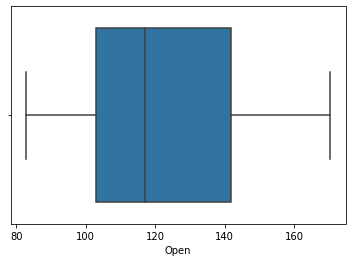

In [ ]:
# check for outlier values
sns.boxplot(data=amzn, x='Open')
plt.show()

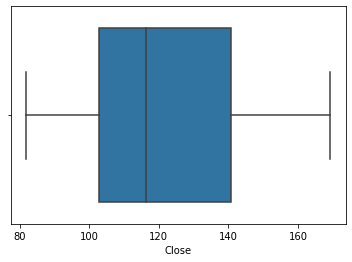

In [ ]:
sns.boxplot(data=amzn, x='Close')
plt.show()

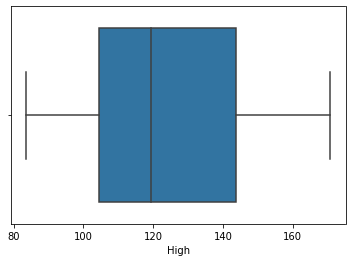

In [ ]:
sns.boxplot(data=amzn, x='High')
plt.show()

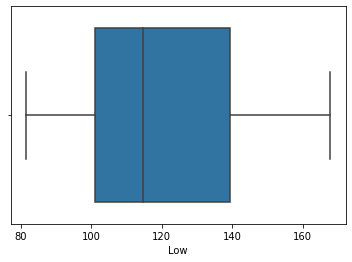

In [ ]:
sns.boxplot(data=amzn, x='Low')
plt.show()

In [ ]:
# There are no outlier values for any feature which means that there was no drastic change in the stock prices over the period of one year

In [ ]:
# plot using pairplot
# first seperate the four columns
# create a copy of amazon dataset
data = amzn.copy()
data = data.drop(['Volume', 'Dividends', 'Stock Splits'], axis=1)

In [ ]:
data.head()

,Open,High,Low,Close,returns,trend
Date,,,,,,
2022-02-01 00:00:00-05:00,150.000000,151.707993,147.627502,151.193497,0.007957,up
2022-02-02 00:00:00-05:00,155.050507,155.074997,148.863495,150.612503,-0.028623,down
2022-02-03 00:00:00-05:00,141.737503,144.247498,138.332993,138.845505,-0.020404,down
2022-02-04 00:00:00-05:00,155.606506,161.199997,150.608002,157.639496,0.013065,up
2022-02-07 00:00:00-05:00,158.520004,162.690994,157.250000,157.935501,-0.003687,down


In [ ]:
data.reset_index()
data.head()

,Open,High,Low,Close,returns,trend
Date,,,,,,
2022-02-01 00:00:00-05:00,150.000000,151.707993,147.627502,151.193497,0.007957,up
2022-02-02 00:00:00-05:00,155.050507,155.074997,148.863495,150.612503,-0.028623,down
2022-02-03 00:00:00-05:00,141.737503,144.247498,138.332993,138.845505,-0.020404,down
2022-02-04 00:00:00-05:00,155.606506,161.199997,150.608002,157.639496,0.013065,up
2022-02-07 00:00:00-05:00,158.520004,162.690994,157.250000,157.935501,-0.003687,down


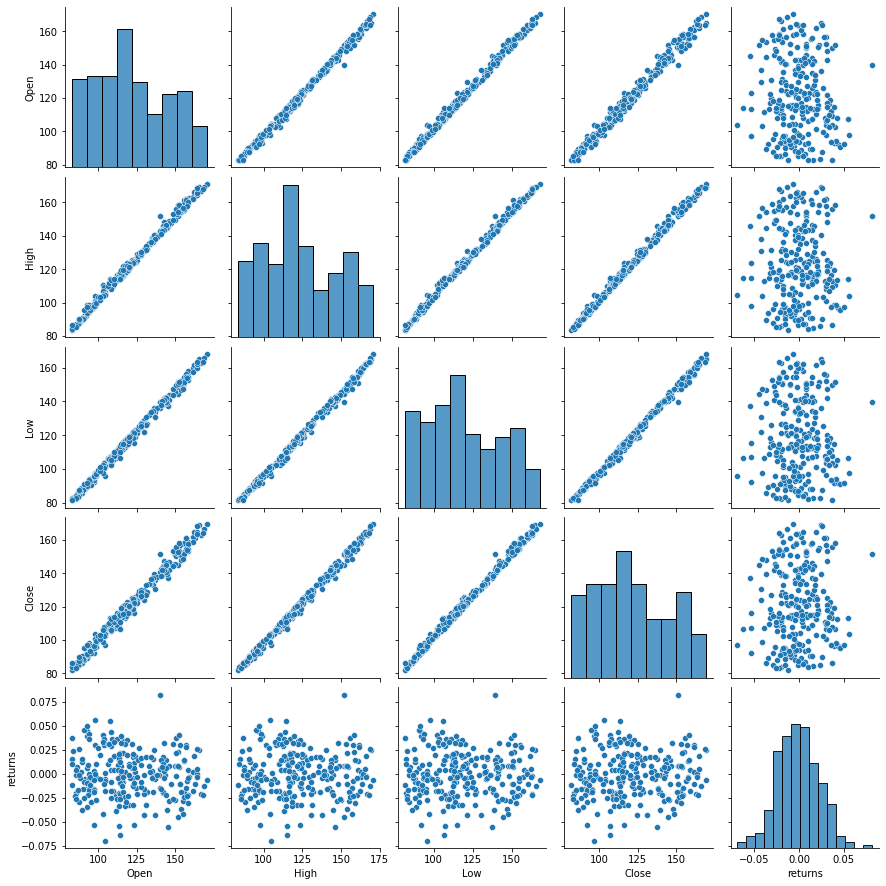

In [ ]:
# now we have only required columns we can use pairplot now
sns.pairplot(data=data)
plt.show()

In [ ]:
# Google stock prices
google = yf.Ticker("GOOG")
goog = google.history(start="2022-02-01", end="2023-02-01", interval="1d")

In [ ]:
goog.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2022-02-01 00:00:00-05:00,137.835007,138.199997,134.568253,137.878494,51204000,0.0,0.0
2022-02-02 00:00:00-05:00,151.863495,152.100006,145.557495,148.036499,89750000,0.0,0.0
2022-02-03 00:00:00-05:00,145.294998,149.117706,142.205002,142.650497,56930000,0.0,0.0
2022-02-04 00:00:00-05:00,143.016998,144.535248,139.817505,143.016006,49224000,0.0,0.0
2022-02-07 00:00:00-05:00,143.709000,143.846497,138.699005,138.938004,44610000,0.0,0.0


In [ ]:
# check for missing values
goog.isnull().sum()

Open            0
High            0
Low             0
Close           0
Volume          0
Dividends       0
Stock Splits    0
dtype: int64

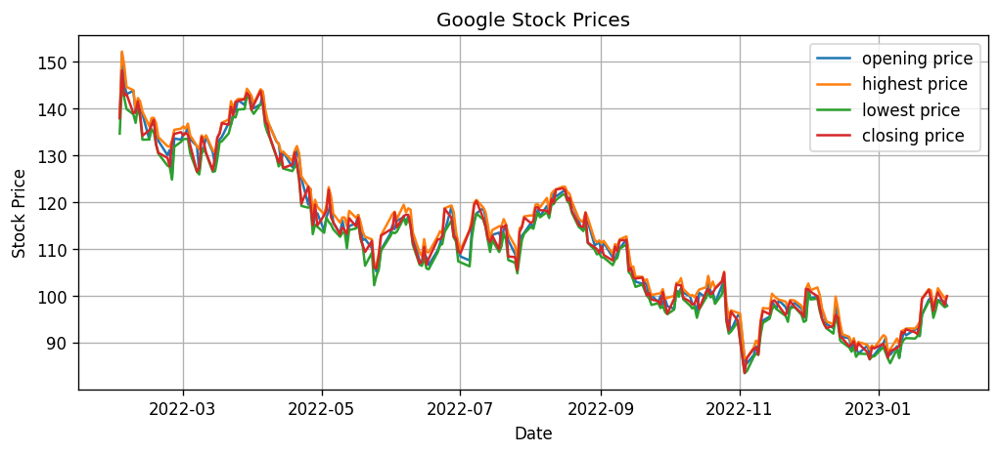

In [ ]:
# there are no missing values for google
# plot all the prices for google
plt.figure(figsize=(10,4), dpi=120)
plt.plot(goog['Open'], label='opening price')
plt.plot(goog['High'], label='highest price')
plt.plot(goog['Low'], label='lowest price')
plt.plot(goog['Close'], label='closing price')
plt.title('Google Stock Prices')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.grid(True)
plt.show()

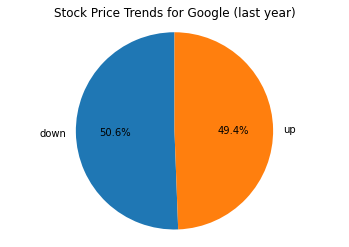

In [ ]:
goog['returns'] = (goog['Close'] - goog['Open']) / goog['Open']

# Create a new column that indicates if the stock price trended up or down each day
goog['trend'] = 'up'
goog.loc[goog['returns'] < 0, 'trend'] = 'down'

# Count the number of times the stock price trended up and down
trend_counts = goog['trend'].value_counts()

# Plot the data as a pie chart
plt.pie(trend_counts, labels=trend_counts.index, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Stock Price Trends for Google (last year)')
plt.show()

In [ ]:
# correlation
goog.corr()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,returns
Open,1.000000,0.996785,0.996610,0.990658,0.108491,NaN,0.006232,-0.125768
High,0.996785,1.000000,0.997085,0.996240,0.122953,NaN,0.005324,-0.061555
Low,0.996610,0.997085,1.000000,0.996231,0.079242,NaN,-0.004175,-0.061842
Close,0.990658,0.996240,0.996231,1.000000,0.098972,NaN,-0.007816,0.009388
Volume,0.108491,0.122953,0.079242,0.098972,1.000000,NaN,0.030949,-0.063395
Dividends,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Stock Splits,0.006232,0.005324,-0.004175,-0.007816,0.030949,NaN,1.000000,-0.102524
returns,-0.125768,-0.061555,-0.061842,0.009388,-0.063395,NaN,-0.102524,1.000000


In [ ]:
# daily average return of google
goog['returns'] = (goog['Close'] - goog['Open']) / goog['Open']

# Calculate the average daily return
average_daily_return = goog['returns'].mean()

print("The average daily return for Google stock over the last year is: {:.2f}%".format(average_daily_return*100))

The average daily return for Google stock over the last year is: 0.00%


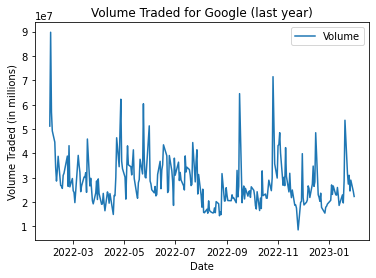

In [ ]:
# change in google stocks traded over time
plt.plot(goog.index, goog['Volume'], label='Volume')
plt.title('Volume Traded for Google (last year)')
plt.xlabel('Date')
plt.ylabel('Volume Traded (in millions)')
plt.legend()
plt.show()

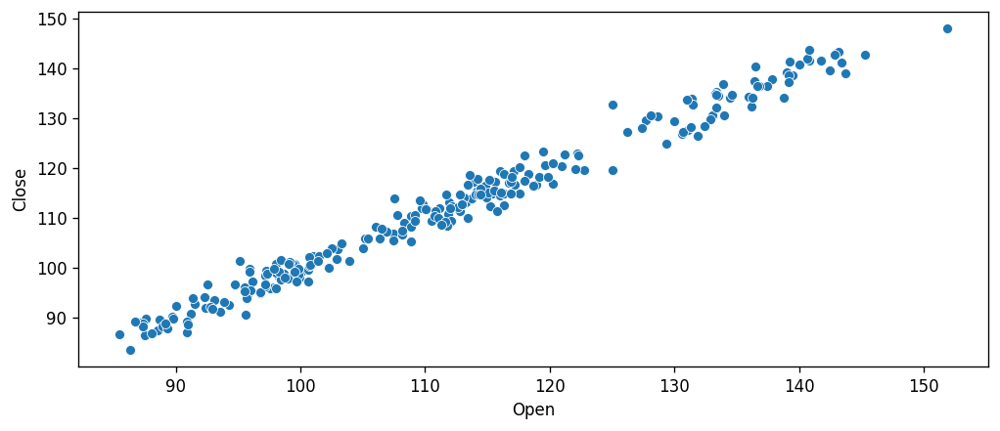

In [ ]:
# compare opening vs closing price
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=goog, x='Open', y='Close')
plt.show()

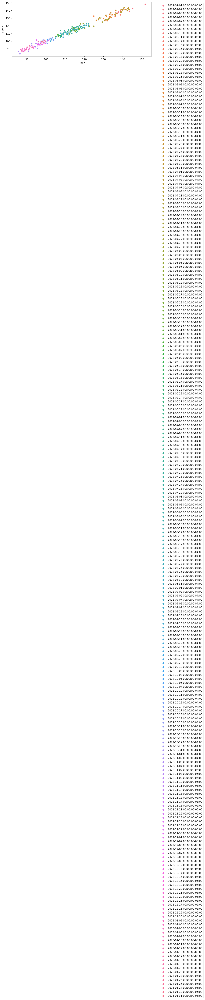

In [ ]:
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=goog, x='Open', y='Close', hue='Date')
plt.legend(bbox_to_anchor=[1.05,1])
plt.show()

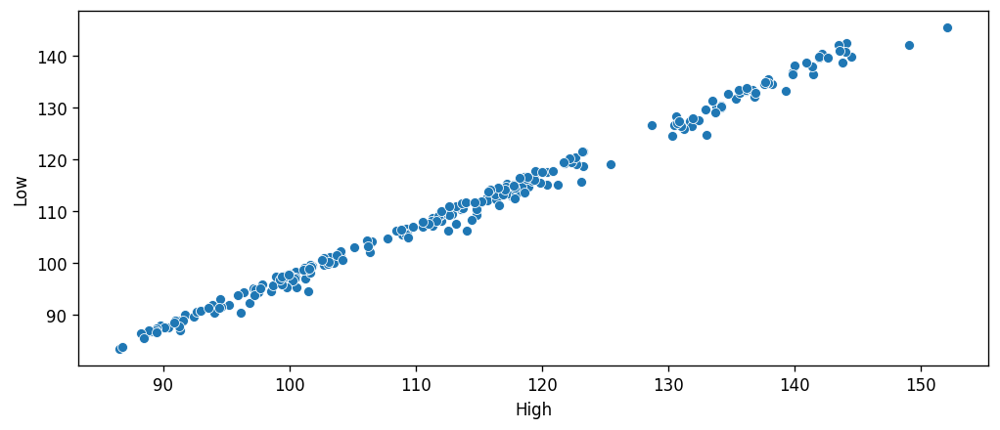

In [ ]:
# compare high vs low price
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=goog, x='High', y='Low')
plt.show()

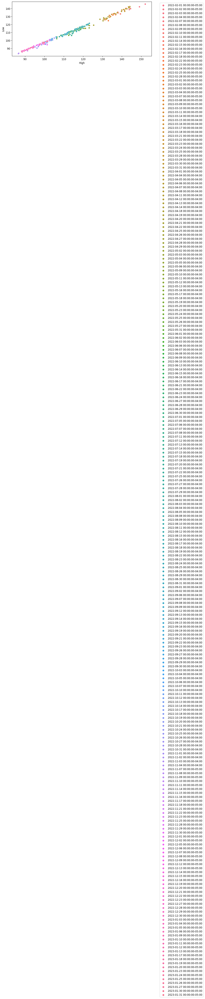

In [ ]:
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=goog, x='High', y='Low', hue='Date')
plt.legend(bbox_to_anchor=[1.05,1])
plt.show()

<Figure size 1200x480 with 0 Axes>

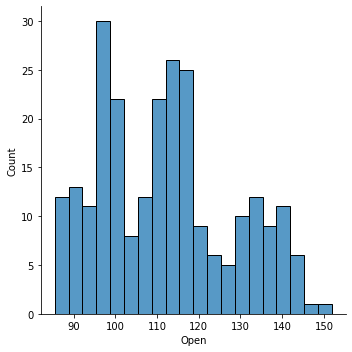

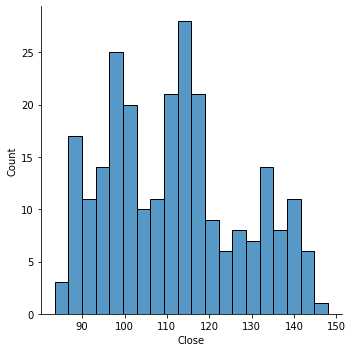

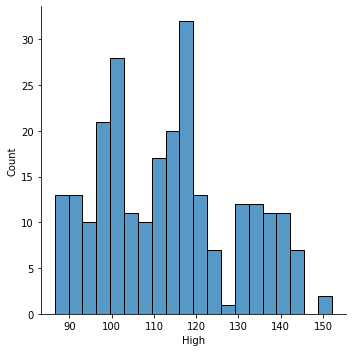

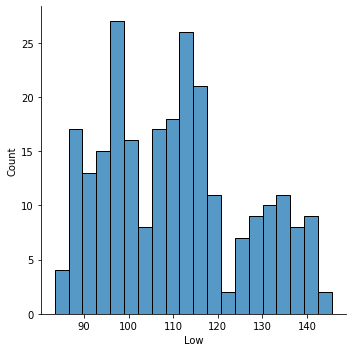

In [ ]:
# Explore the histograms of prices
plt.figure(figsize=(10,4), dpi=120)
sns.displot(data=goog, x='Open',bins=20)
sns.displot(data=goog, x='Close',bins=20)
sns.displot(data=goog, x='High',bins=20)
sns.displot(data=goog, x='Low',bins=20)
plt.show()

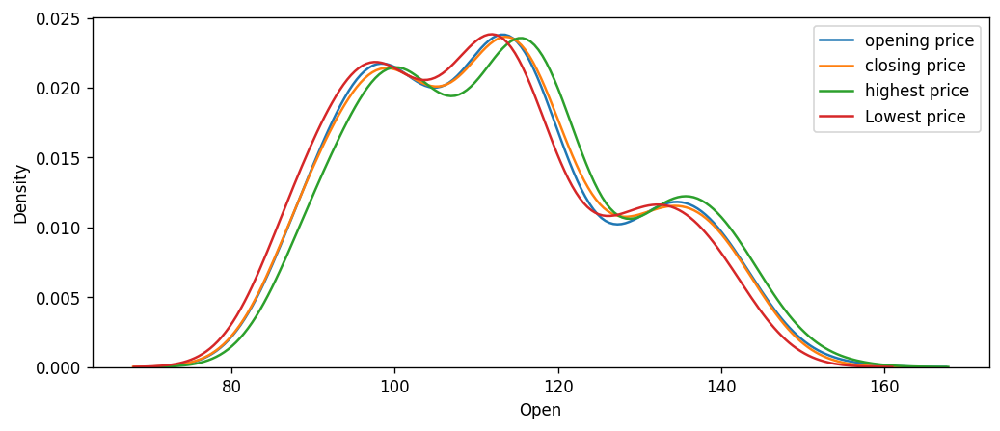

In [ ]:
# kdeplots of prices
plt.figure(figsize=(10,4), dpi=120)
sns.kdeplot(data=goog, x='Open', label='opening price')
sns.kdeplot(data=goog, x='Close', label='closing price')
sns.kdeplot(data=goog, x='High', label='highest price')
sns.kdeplot(data=goog, x='Low', label='Lowest price')
plt.legend()
plt.show()

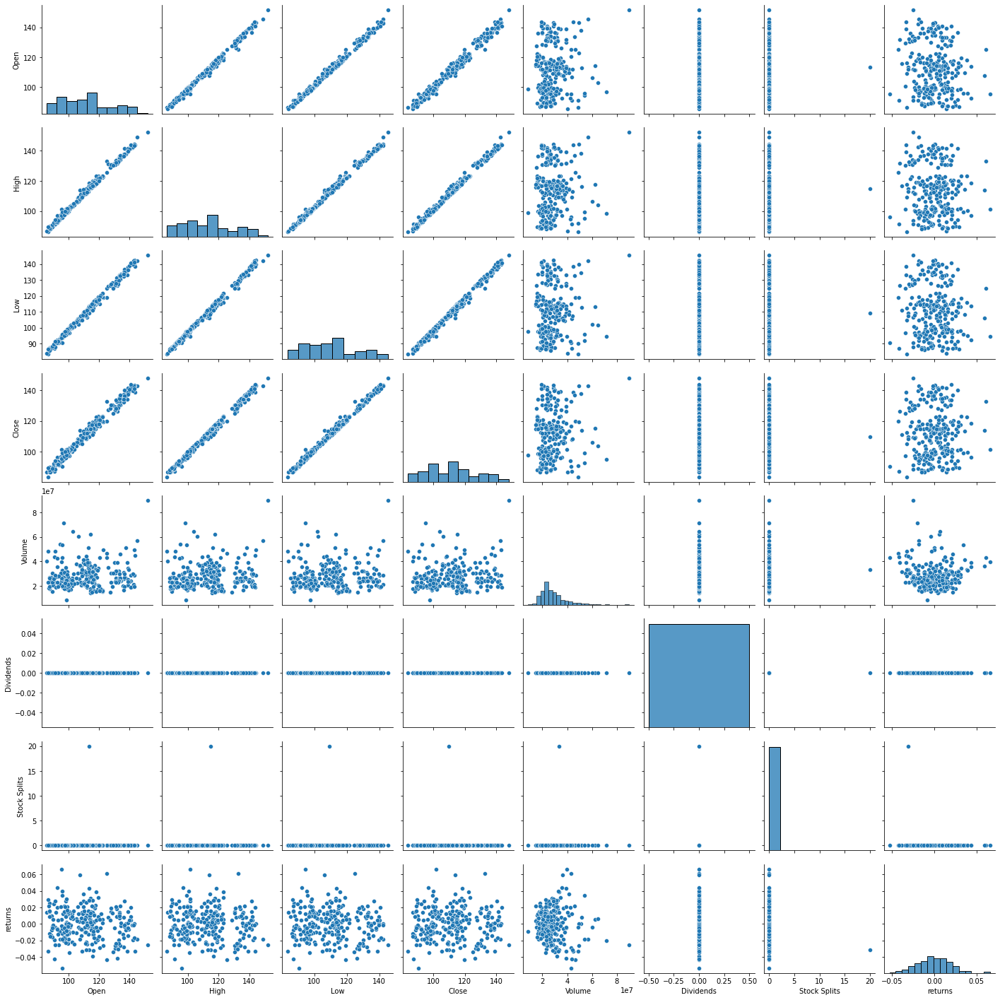

In [ ]:
sns.pairplot(data=goog)

In [ ]:
# Apple Stock prices
apple = yf.Ticker("AAPL")
aapl = apple.history(start="2022-02-01", end="2023-02-01", interval="1d")

In [ ]:
aapl.isnull().sum()

Open            0
High            0
Low             0
Close           0
Volume          0
Dividends       0
Stock Splits    0
dtype: int64

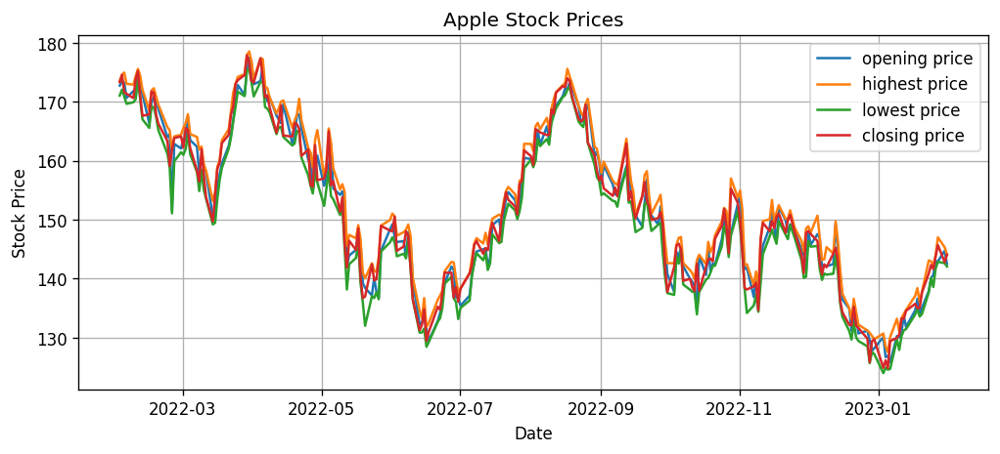

In [ ]:
# No missing values for apple stocks
# plot all the prices for apple
plt.figure(figsize=(10,4), dpi=120)
plt.plot(aapl['Open'], label='opening price')
plt.plot(aapl['High'], label='highest price')
plt.plot(aapl['Low'], label='lowest price')
plt.plot(aapl['Close'], label='closing price')
plt.title('Apple Stock Prices')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.grid(True)
plt.show()

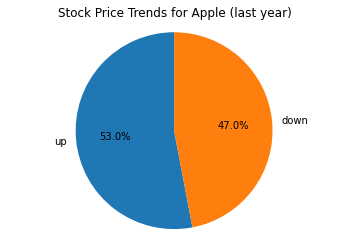

In [ ]:
aapl['returns'] = (aapl['Close'] - aapl['Open']) / aapl['Open']

# Create a new column that indicates if the stock price trended up or down each day
aapl['trend'] = 'up'
aapl.loc[aapl['returns'] < 0, 'trend'] = 'down'

# Count the number of times the stock price trended up and down
trend_counts = aapl['trend'].value_counts()

# Plot the data as a pie chart
plt.pie(trend_counts, labels=trend_counts.index, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Stock Price Trends for Apple (last year)')
plt.show()

In [ ]:
# correlation
aapl.corr()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,returns
Open,1.000000,0.991960,0.991476,0.976428,-0.085813,0.059698,NaN,-0.116620
High,0.991960,1.000000,0.992473,0.990300,-0.053940,0.061988,NaN,-0.014860
Low,0.991476,0.992473,1.000000,0.991462,-0.132088,0.052850,NaN,-0.009156
Close,0.976428,0.990300,0.991462,1.000000,-0.094738,0.059597,NaN,0.099853
Volume,-0.085813,-0.053940,-0.132088,-0.094738,1.000000,0.078936,NaN,-0.040302
Dividends,0.059698,0.061988,0.052850,0.059597,0.078936,1.000000,NaN,-0.007767
Stock Splits,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
returns,-0.116620,-0.014860,-0.009156,0.099853,-0.040302,-0.007767,NaN,1.000000


In [ ]:
# daily returns of apple
aapl['returns'] = (aapl['Close'] - aapl['Open']) / aapl['Open']

# Calculate the average daily return
average_daily_return = aapl['returns'].mean()

print("The average daily return for Apple stock over the last year is: {:.2f}%".format(average_daily_return*100))

The average daily return for Apple stock over the last year is: 0.09%


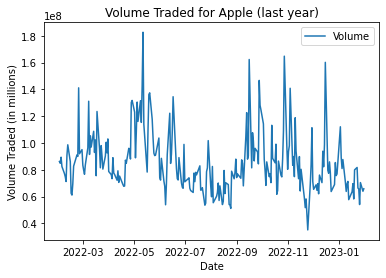

In [ ]:
# change in apple stocks traded over time
plt.plot(aapl.index, aapl['Volume'], label='Volume')
plt.title('Volume Traded for Apple (last year)')
plt.xlabel('Date')
plt.ylabel('Volume Traded (in millions)')
plt.legend()
plt.show()

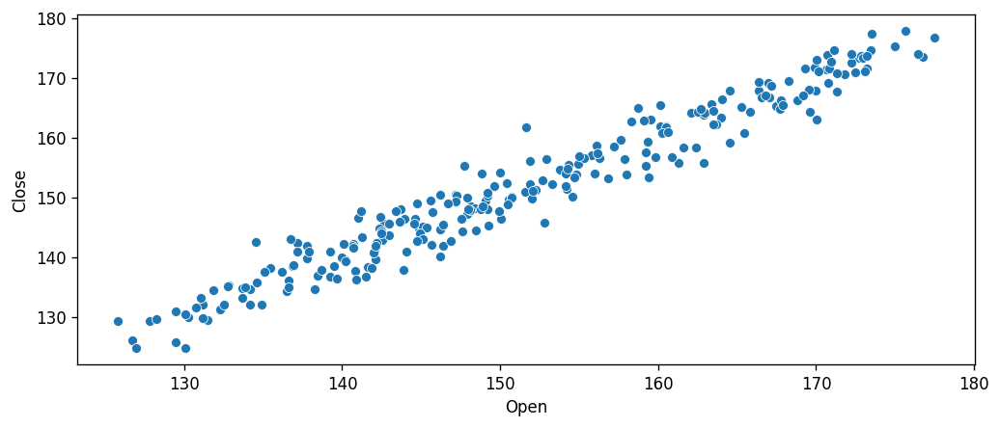

In [ ]:
# compare opening vs closing price
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=aapl, x='Open', y='Close')
plt.show()

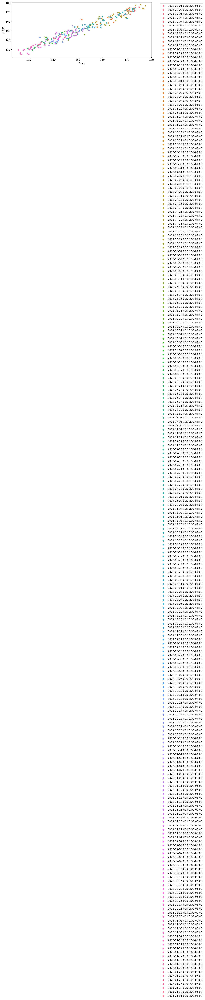

In [ ]:
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=aapl, x='Open', y='Close', hue='Date')
plt.legend(bbox_to_anchor=[1.05,1])
plt.show()

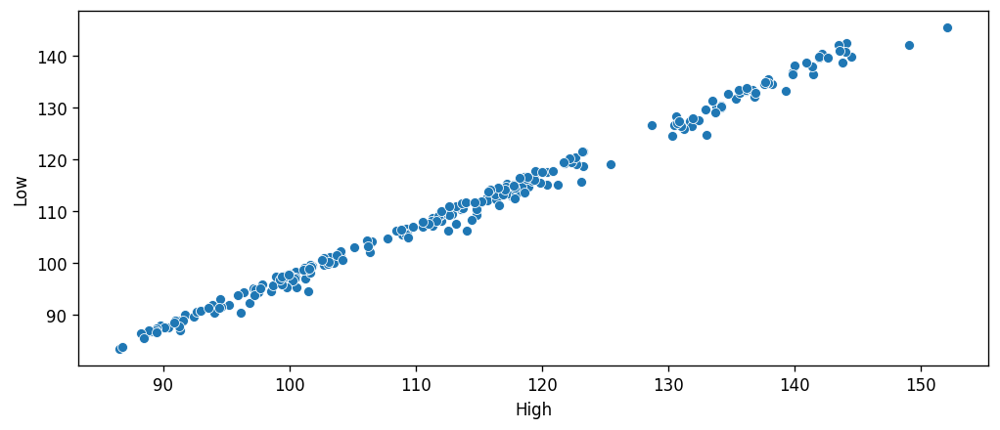

In [ ]:
# compare high vs low price
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=goog, x='High', y='Low')
plt.show()

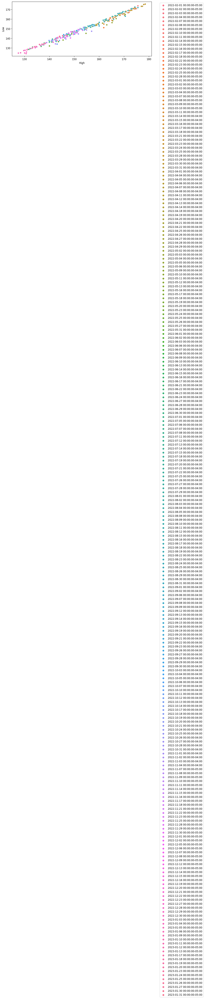

In [ ]:
plt.figure(figsize=(10,4), dpi=120)
sns.scatterplot(data=aapl, x='High', y='Low', hue='Date')
plt.legend(bbox_to_anchor=[1.05,1])
plt.show()

<Figure size 1200x480 with 0 Axes>

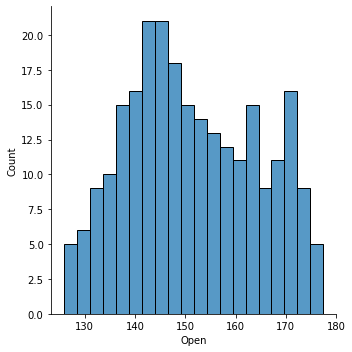

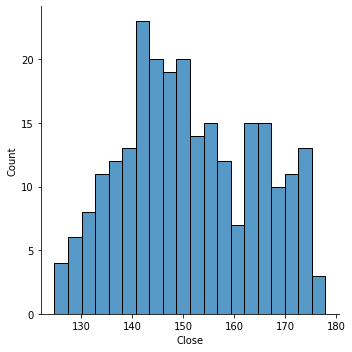

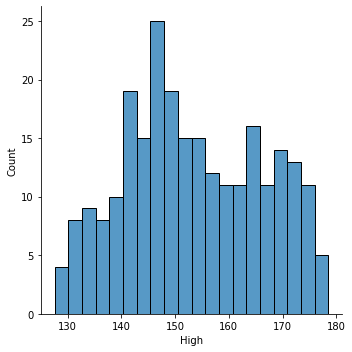

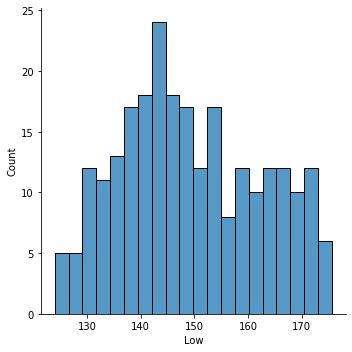

In [ ]:
# Explore the histograms of prices
plt.figure(figsize=(10,4), dpi=120)
sns.displot(data=aapl, x='Open',bins=20)
sns.displot(data=aapl, x='Close',bins=20)
sns.displot(data=aapl, x='High',bins=20)
sns.displot(data=aapl, x='Low',bins=20)
plt.show()

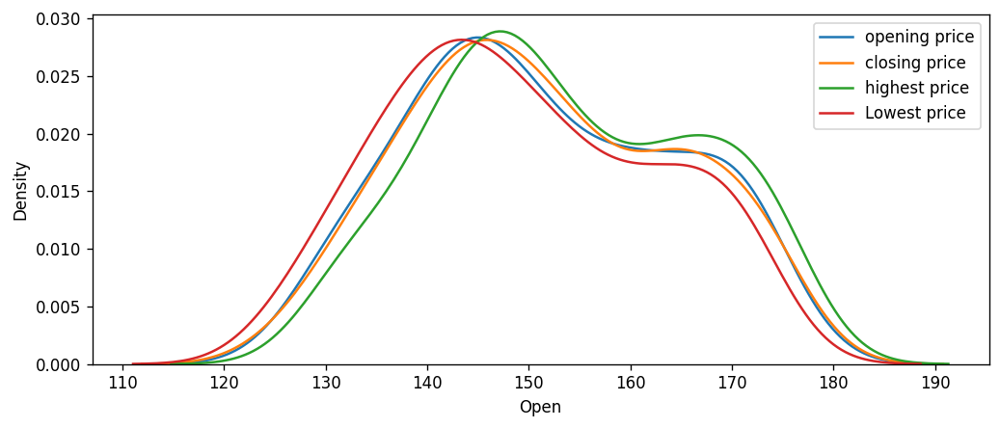

In [ ]:
# kdeplots of prices
plt.figure(figsize=(10,4), dpi=120)
sns.kdeplot(data=aapl, x='Open', label='opening price')
sns.kdeplot(data=aapl, x='Close', label='closing price')
sns.kdeplot(data=aapl, x='High', label='highest price')
sns.kdeplot(data=aapl, x='Low', label='Lowest price')
plt.legend()
plt.show()

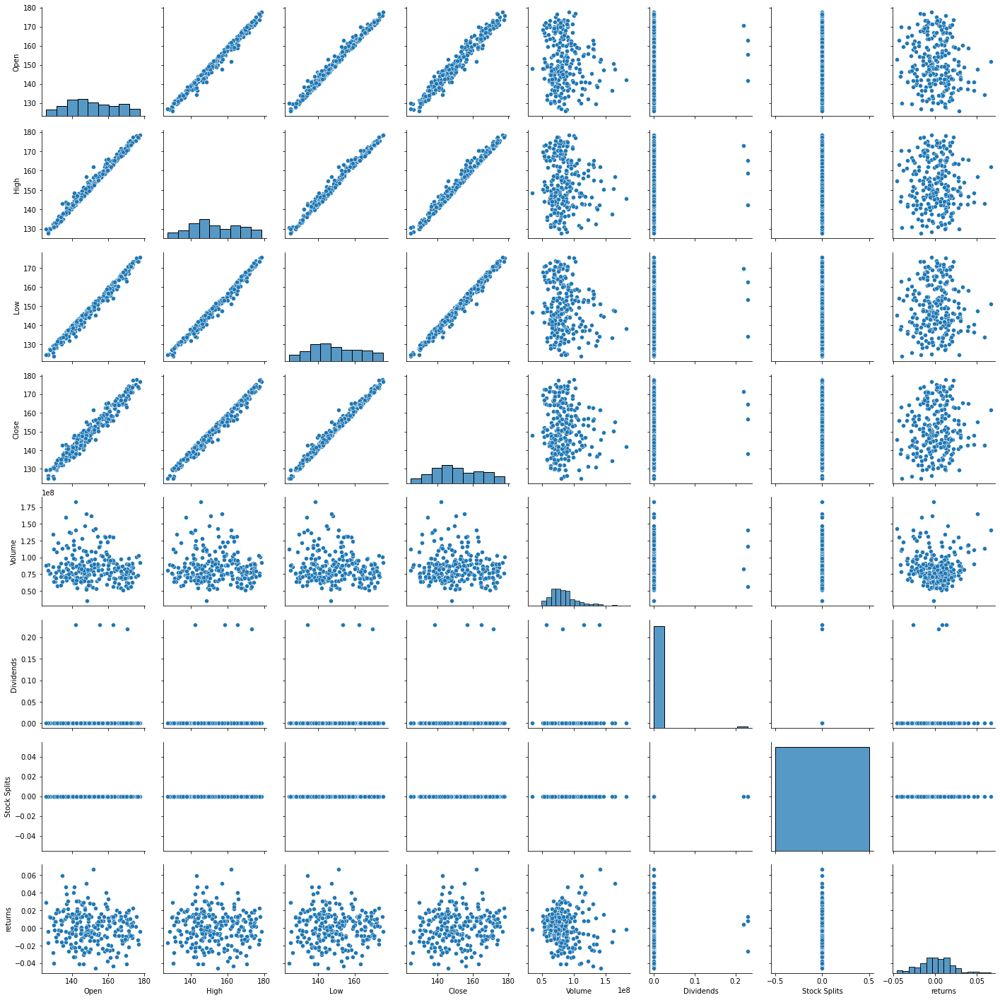

In [ ]:
sns.pairplot(data=aapl)
plt.show()

In [ ]:
import yfinance as yf
data = yf.Tickers("MSFT, GOOG, AAPL, AMZN")
data_hist = data.history(start="2022-02-01", end="2023-02-01", interval="1d")
data_hist

[*********************100%***********************]  4 of 4 completed


Close                                     Dividends       \
                  AAPL        AMZN        GOOG        MSFT      AAPL AMZN   
Date                                                                        
2022-02-01  173.337799  151.193497  137.878494  305.893738      0.00  0.0   
2022-02-02  174.558807  150.612503  148.036499  310.550110      0.00  0.0   
2022-02-03  171.640259  138.845505  142.650497  298.453430      0.00  0.0   
2022-02-04  171.351990  157.639496  143.016006  303.099915      0.22  0.0   
2022-02-07  170.626389  157.935501  138.938004  298.156250      0.00  0.0   
...                ...         ...         ...         ...       ...  ...   
2023-01-25  141.643738   97.180000   96.730003  240.610001      0.00  0.0   
2023-01-26  143.740540   99.220001   99.160004  248.000000      0.00  0.0   
2023-01-27  145.707520  102.239998  100.709999  248.160004      0.00  0.0   
2023-01-30  142.781998  100.550003   97.949997  242.710007      0.00  0.0   
2023-01-31  144.070023  103.129997   99.870003  247.809998      0.00  0.0   

                            High              ...        Open              \
           GOOG MSFT        AAPL        AMZN  ...        GOOG        MSFT   
Date                                          ...                           
2022-02-01  0.0  0.0  173.566119  151.707993  ...  137.835007  307.528415   
2022-02-02  0.0  0.0  174.598524  155.074997  ...  151.863495  306.755677   
2022-02-03  0.0  0.0  174.955935  144.247498  ...  145.294998  306.616927   
2022-02-04  0.0  0.0  173.051700  161.199997  ...  143.016998  297.423096   
2022-02-07  0.0  0.0  172.902593  162.690994  ...  143.709000  303.327793   
...         ...  ...         ...         ...  ...         ...         ...   
2023-01-25  0.0  0.0  142.212861   97.239998  ...   97.199997  234.479996   
2023-01-26  0.0  0.0  144.030091   99.489998  ...   98.279999  243.649994   
2023-01-27  0.0  0.0  147.005541  103.489998  ...   99.050003  248.990005   
2023-01-30  0.0  0.0  145.328113  101.739998  ...   98.745003  244.509995   
2023-01-31  0.0  0.0  144.119949  103.349998  ...   97.860001  243.449997   

           Stock Splits                   Volume                       \
                   AAPL AMZN GOOG MSFT      AAPL       AMZN      GOOG   
Date                                                                    
2022-02-01          0.0  0.0  0.0  0.0  86213900   59220000  51204000   
2022-02-02          0.0  0.0  0.0  0.0  84914300   87330000  89750000   
2022-02-03          0.0  0.0  0.0  0.0  89418100  225532000  56930000   
2022-02-04          0.0  0.0  0.0  0.0  82465400  253456000  49224000   
2022-02-07          0.0  0.0  0.0  0.0  77251200  102624000  44610000   
...                 ...  ...  ...  ...       ...        ...       ...   
2023-01-25          0.0  0.0  0.0  0.0  65799300   94261600  31000900   
2023-01-26          0.0  0.0  0.0  0.0  54105100   68523600  24542100   
2023-01-27          0.0  0.0  0.0  0.0  70492800   87678100  29011900   
2023-01-30          0.0  0.0  0.0  0.0  64015300   70691900  24365100   
2023-01-31          0.0  0.0  0.0  0.0  65874500   66527300  22306800   

                      
                MSFT  
Date                  
2022-02-01  40950400  
2022-02-02  36636000  
2022-02-03  43730000  
2022-02-04  35096500  
2022-02-07  28533300  
...              ...  
2023-01-25  66526600  
2023-01-26  33454500  
2023-01-27  26480800  
2023-01-30  25867400  
2023-01-31  26541100  

[251 rows x 28 columns]

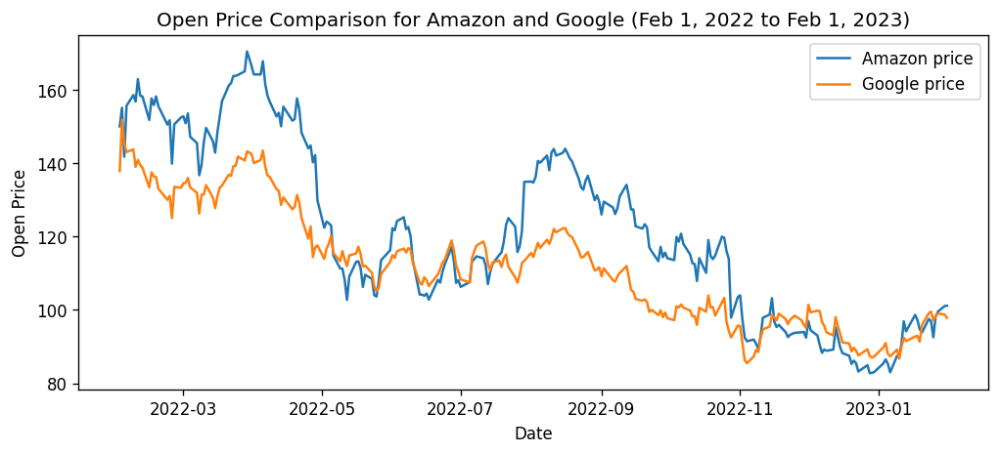

In [ ]:
# plot opening prices for Amazon and Google
plt.figure(figsize=(10,4), dpi=120)
data_amzn = data_hist["Open"]["AMZN"]
data_goog = data_hist["Open"]["GOOG"]
plt.plot(data_amzn.index, data_amzn, label='Amazon price')
plt.plot(data_goog.index, data_goog, label='Google price')
plt.title('Open Price Comparison for Amazon and Google (Feb 1, 2022 to Feb 1, 2023)')
plt.xlabel('Date')
plt.ylabel('Open Price')
plt.legend()
plt.show()

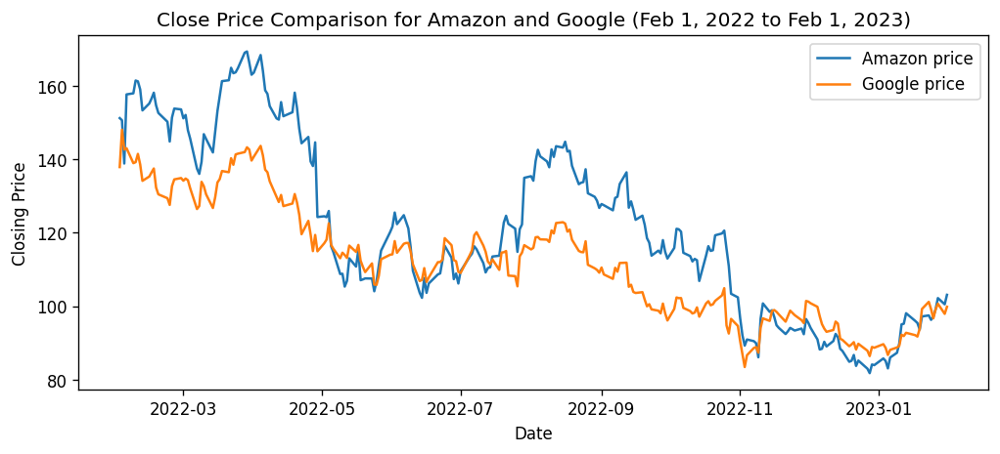

In [ ]:
# plot closing prices for Amazon and Google
plt.figure(figsize=(10,4), dpi=120)
data_amzn = data_hist["Close"]["AMZN"]
data_goog = data_hist["Close"]["GOOG"]
plt.plot(data_amzn.index, data_amzn, label='Amazon price')
plt.plot(data_goog.index, data_goog, label='Google price')
plt.title('Close Price Comparison for Amazon and Google (Feb 1, 2022 to Feb 1, 2023)')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

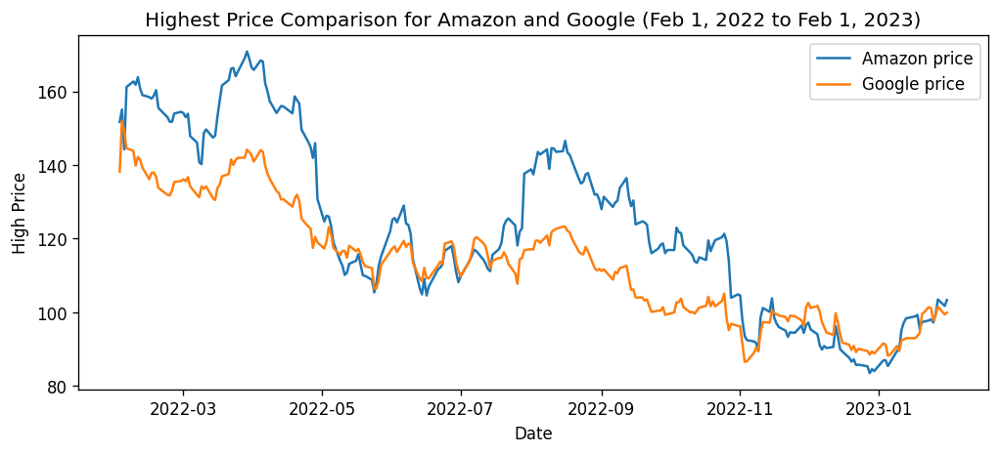

In [ ]:
# plot Highest prices for Amazon and Google
plt.figure(figsize=(10,4), dpi=120)
data_amzn = data_hist["High"]["AMZN"]
data_goog = data_hist["High"]["GOOG"]
plt.plot(data_amzn.index, data_amzn, label='Amazon price')
plt.plot(data_goog.index, data_goog, label='Google price')
plt.title('Highest Price Comparison for Amazon and Google (Feb 1, 2022 to Feb 1, 2023)')
plt.xlabel('Date')
plt.ylabel('High Price')
plt.legend()
plt.show()

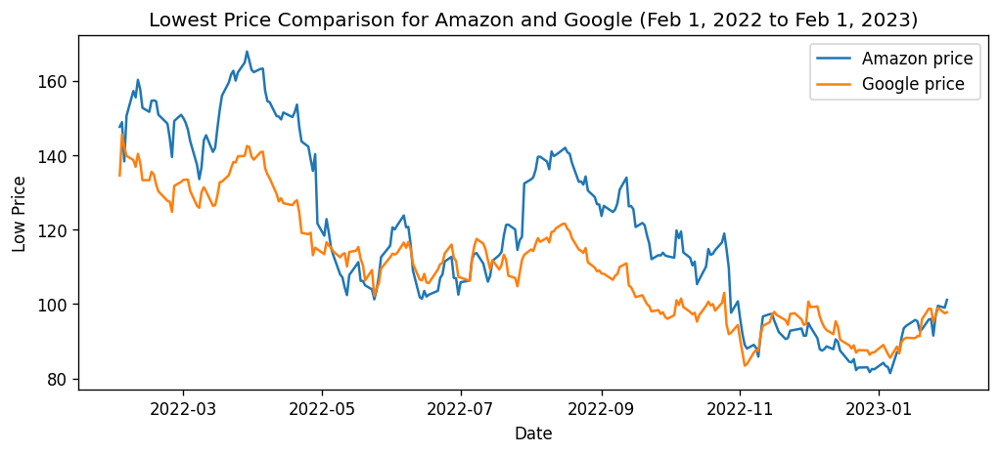

In [ ]:
# plot Lowest prices for Amazon and Google
plt.figure(figsize=(10,4), dpi=120)
data_amzn = data_hist["Low"]["AMZN"]
data_goog = data_hist["Low"]["GOOG"]
plt.plot(data_amzn.index, data_amzn, label='Amazon price')
plt.plot(data_goog.index, data_goog, label='Google price')
plt.title('Lowest Price Comparison for Amazon and Google (Feb 1, 2022 to Feb 1, 2023)')
plt.xlabel('Date')
plt.ylabel('Low Price')
plt.legend()
plt.show()

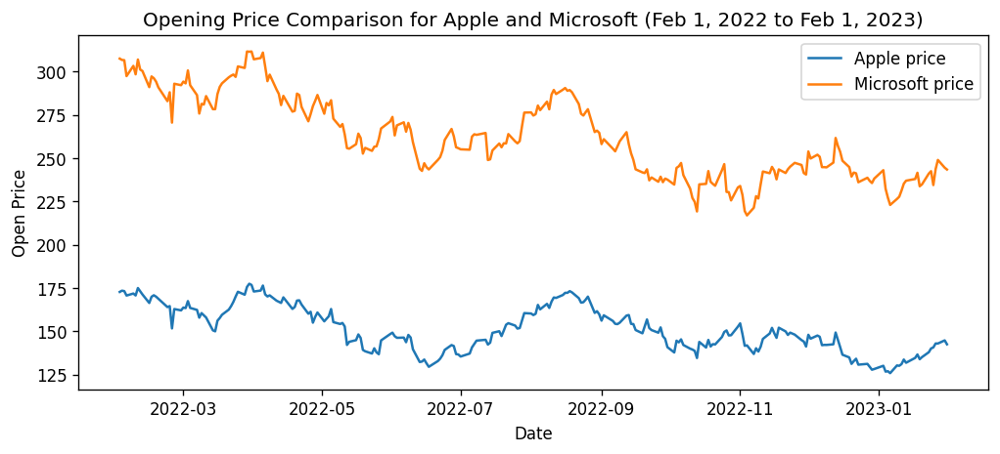

In [ ]:
# plot opening prices for Apple and Microsoft
plt.figure(figsize=(10,4), dpi=120)
data_aapl = data_hist["Open"]["AAPL"]
data_msft = data_hist["Open"]["MSFT"]
plt.plot(data_aapl.index, data_aapl, label='Apple price')
plt.plot(data_msft.index, data_msft, label='Microsoft price')
plt.title('Opening Price Comparison for Apple and Microsoft (Feb 1, 2022 to Feb 1, 2023)')
plt.xlabel('Date')
plt.ylabel('Open Price')
plt.legend()
plt.show()

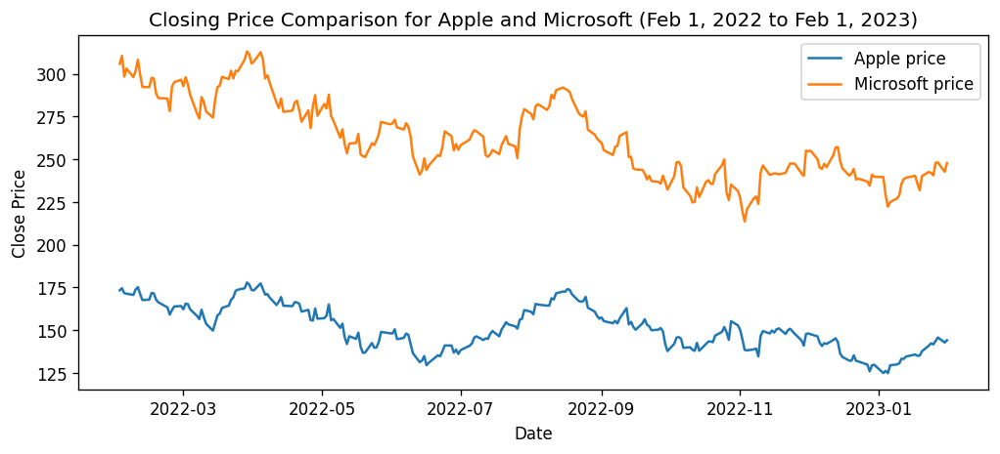

In [ ]:
# plot closing prices for Apple and Microsoft
plt.figure(figsize=(10,4), dpi=120)
data_aapl = data_hist["Close"]["AAPL"]
data_msft = data_hist["Close"]["MSFT"]
plt.plot(data_aapl.index, data_aapl, label='Apple price')
plt.plot(data_msft.index, data_msft, label='Microsoft price')
plt.title('Closing Price Comparison for Apple and Microsoft (Feb 1, 2022 to Feb 1, 2023)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

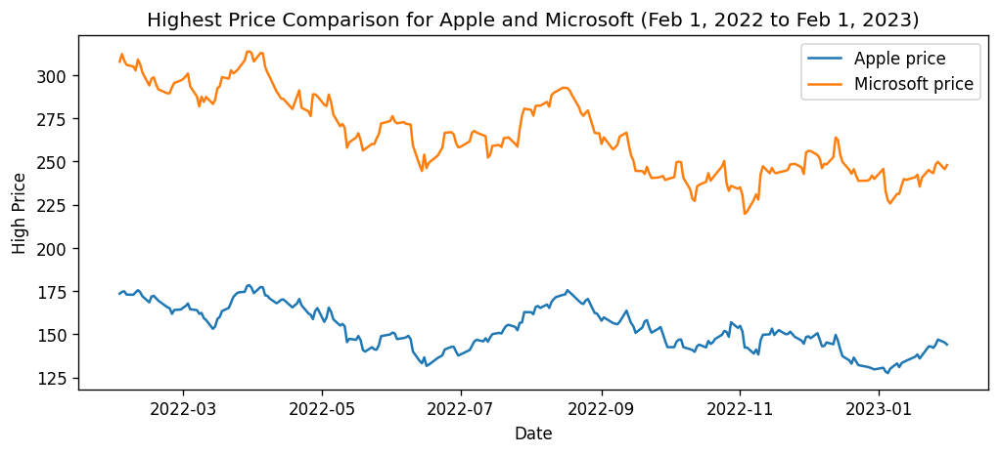

In [ ]:
# plot highest prices for Apple and Microsoft
plt.figure(figsize=(10,4), dpi=120)
data_aapl = data_hist["High"]["AAPL"]
data_msft = data_hist["High"]["MSFT"]
plt.plot(data_aapl.index, data_aapl, label='Apple price')
plt.plot(data_msft.index, data_msft, label='Microsoft price')
plt.title('Highest Price Comparison for Apple and Microsoft (Feb 1, 2022 to Feb 1, 2023)')
plt.xlabel('Date')
plt.ylabel('High Price')
plt.legend()
plt.show()

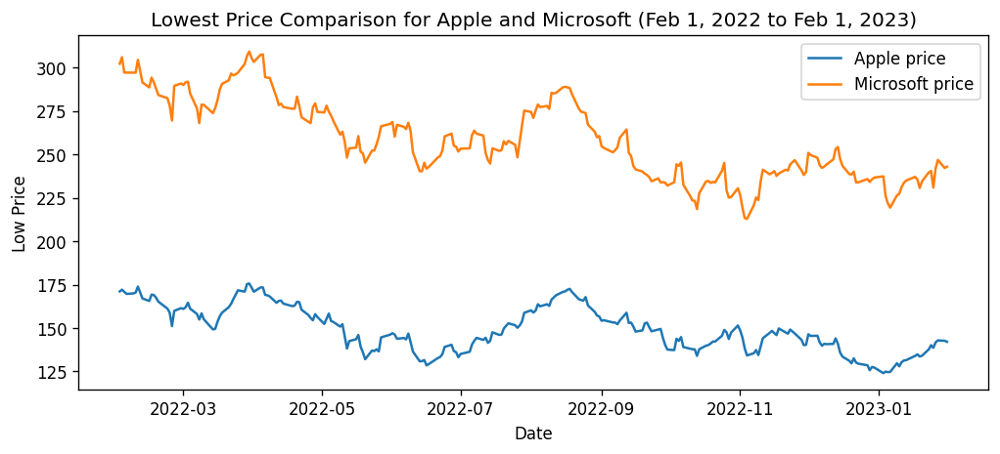

In [ ]:
# plot lowest prices for Apple and Microsoft
plt.figure(figsize=(10,4), dpi=120)
data_aapl = data_hist["Low"]["AAPL"]
data_msft = data_hist["Low"]["MSFT"]
plt.plot(data_aapl.index, data_aapl, label='Apple price')
plt.plot(data_msft.index, data_msft, label='Microsoft price')
plt.title('Lowest Price Comparison for Apple and Microsoft (Feb 1, 2022 to Feb 1, 2023)')
plt.xlabel('Date')
plt.ylabel('Low Price')
plt.legend()
plt.show()

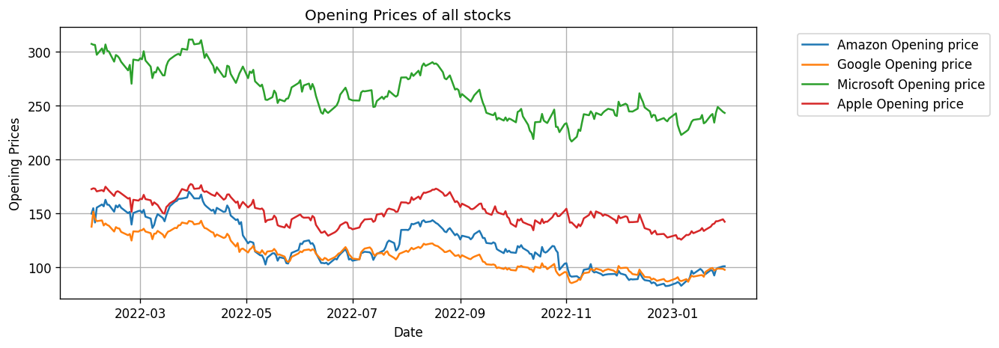

In [ ]:
# Opening price for all stocks over the past year
plt.figure(figsize=(10,4), dpi=120)
data_amzn = data_hist['Open']['AMZN']
data_goog = data_hist['Open']['GOOG']
data_msft = data_hist['Open']['MSFT']
data_aapl = data_hist['Open']['AAPL']
plt.plot(data_amzn.index, data_amzn, label='Amazon Opening price')
plt.plot(data_goog.index, data_goog, label='Google Opening price')
plt.plot(data_msft.index, data_msft, label='Microsoft Opening price')
plt.plot(data_aapl.index, data_aapl, label='Apple Opening price')
plt.xlabel("Date")
plt.ylabel("Opening Prices")
plt.title("Opening Prices of all stocks")
plt.legend(bbox_to_anchor=[1.05,1.0])
plt.grid(True)
plt.show()

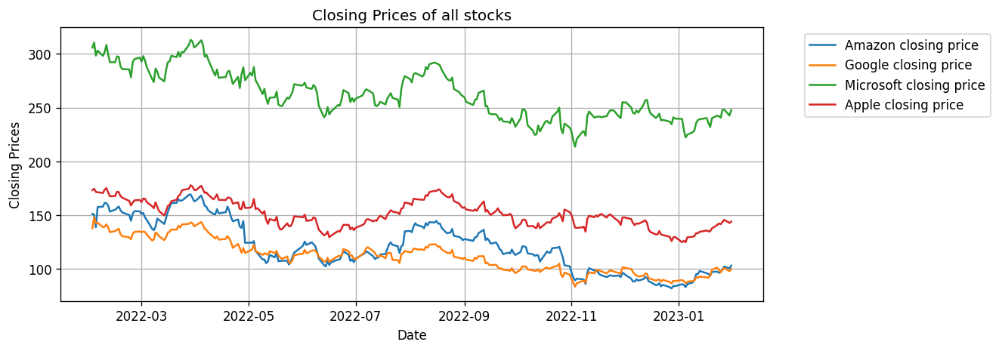

In [ ]:
# Closing price for all stocks over the past year
plt.figure(figsize=(10,4), dpi=120)
data_amzn = data_hist['Close']['AMZN']
data_goog = data_hist['Close']['GOOG']
data_msft = data_hist['Close']['MSFT']
data_aapl = data_hist['Close']['AAPL']
plt.plot(data_amzn.index, data_amzn, label='Amazon closing price')
plt.plot(data_goog.index, data_goog, label='Google closing price')
plt.plot(data_msft.index, data_msft, label='Microsoft closing price')
plt.plot(data_aapl.index, data_aapl, label='Apple closing price')
plt.xlabel("Date")
plt.ylabel("Closing Prices")
plt.title("Closing Prices of all stocks")
plt.legend(bbox_to_anchor=[1.05,1.0])
plt.grid(True)
plt.show()

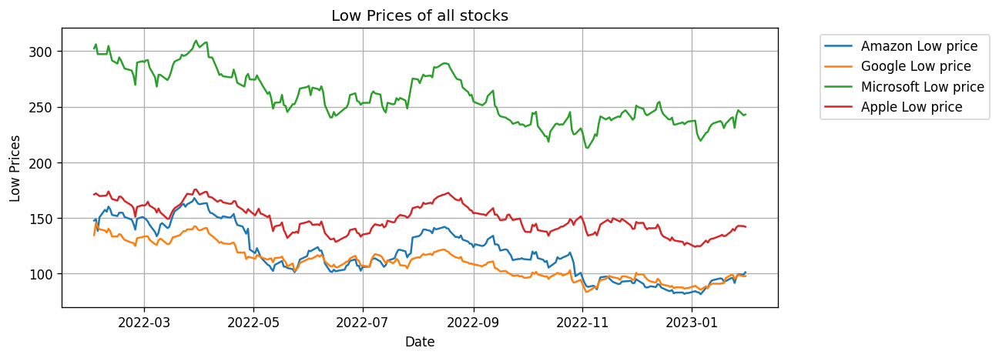

In [ ]:
# Lowest price for all stocks over the past year
plt.figure(figsize=(10,4), dpi=120)
data_amzn = data_hist['Low']['AMZN']
data_goog = data_hist['Low']['GOOG']
data_msft = data_hist['Low']['MSFT']
data_aapl = data_hist['Low']['AAPL']
plt.plot(data_amzn.index, data_amzn, label='Amazon Low price')
plt.plot(data_goog.index, data_goog, label='Google Low price')
plt.plot(data_msft.index, data_msft, label='Microsoft Low price')
plt.plot(data_aapl.index, data_aapl, label='Apple Low price')
plt.xlabel("Date")
plt.ylabel("Low Prices")
plt.title("Low Prices of all stocks")
plt.legend(bbox_to_anchor=[1.05,1.0])
plt.grid(True)
plt.show()

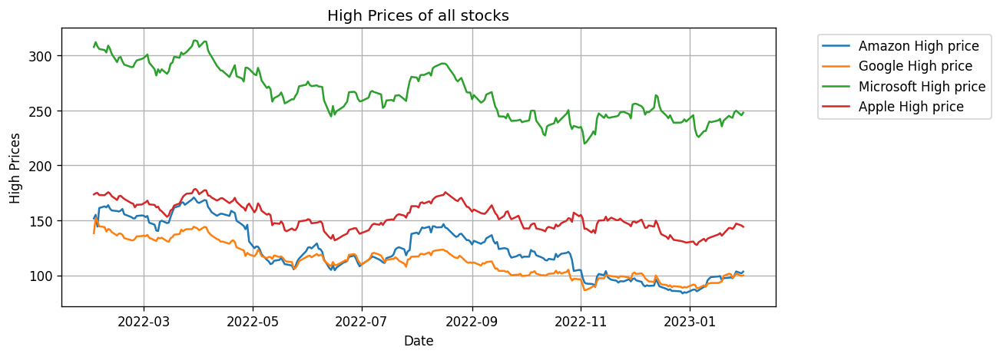

In [ ]:
# High price for all stocks over the past year
plt.figure(figsize=(10,4), dpi=120)
data_amzn = data_hist['High']['AMZN']
data_goog = data_hist['High']['GOOG']
data_msft = data_hist['High']['MSFT']
data_aapl = data_hist['High']['AAPL']
plt.plot(data_amzn.index, data_amzn, label='Amazon High price')
plt.plot(data_goog.index, data_goog, label='Google High price')
plt.plot(data_msft.index, data_msft, label='Microsoft High price')
plt.plot(data_aapl.index, data_aapl, label='Apple High price')
plt.xlabel("Date")
plt.ylabel("High Prices")
plt.title("High Prices of all stocks")
plt.legend(bbox_to_anchor=[1.05,1.0])
plt.grid(True)
plt.show()

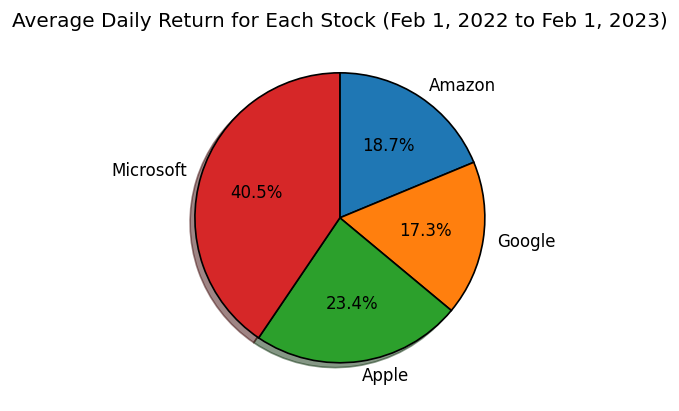

In [ ]:
# Comparison of average daily return for Each stock
plt.figure(figsize=(10,4), dpi=120)
data_amzn_returns = data_hist["Close"]["AMZN"].mean()
data_goog_returns = data_hist["Close"]["GOOG"].mean()
data_aapl_returns = data_hist["Close"]["AAPL"].mean()
data_msft_returns = data_hist["Close"]["MSFT"].mean()
returns = [data_amzn_returns, data_goog_returns, data_aapl_returns, data_msft_returns]
plt.pie(returns, labels=["Amazon", "Google", "Apple", "Microsoft"], startangle=90, counterclock=False,
        autopct='%1.1f%%', shadow=True, wedgeprops={'edgecolor':'black'})
plt.title('Average Daily Return for Each Stock (Feb 1, 2022 to Feb 1, 2023)')
plt.show()

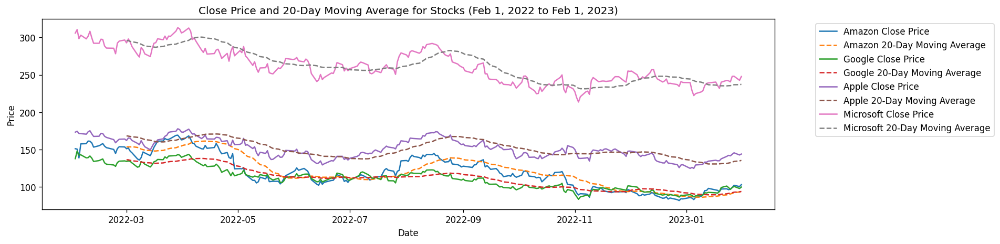

In [ ]:
# Calculate the 20-day moving average for each stock
plt.figure(figsize=(15,4), dpi=120)
data_amzn_ma = data_hist["Close"]["AMZN"].rolling(window=20).mean()
data_goog_ma = data_hist["Close"]["GOOG"].rolling(window=20).mean()
data_aapl_ma = data_hist["Close"]["AAPL"].rolling(window=20).mean()
data_msft_ma = data_hist["Close"]["MSFT"].rolling(window=20).mean()
plt.plot(data_hist["Close"]["AMZN"], label='Amazon Close Price')
plt.plot(data_amzn_ma, label='Amazon 20-Day Moving Average', linestyle='--')
plt.plot(data_hist["Close"]["GOOG"], label='Google Close Price')
plt.plot(data_goog_ma, label='Google 20-Day Moving Average', linestyle='--')
plt.plot(data_hist["Close"]["AAPL"], label='Apple Close Price')
plt.plot(data_aapl_ma, label='Apple 20-Day Moving Average', linestyle='--')
plt.plot(data_hist["Close"]["MSFT"], label='Microsoft Close Price')
plt.plot(data_msft_ma, label='Microsoft 20-Day Moving Average', linestyle='--')
plt.title('Close Price and 20-Day Moving Average for Stocks (Feb 1, 2022 to Feb 1, 2023)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(bbox_to_anchor=[1.05,1])
plt.show()

In [ ]:
# EDA COMPLETE.